In [3]:
from scipy.special import softmax

In [4]:
from itertools import combinations

from transformers import AutoModelForMaskedLM, AutoTokenizer
from sklearn.decomposition import PCA, TruncatedSVD
import umap
import numpy as np

import torch
import torch.nn as nn

import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
from matplotlib import cm
import matplotlib as mpl

from matplotlib.colors import TwoSlopeNorm
from sklearn.metrics.pairwise import euclidean_distances, cosine_distances, paired_distances, cosine_similarity

In [5]:
model_name = 'bert-base-uncased'
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForMaskedLM.from_pretrained(model_name, output_attentions=True)

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertForMaskedLM: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight', 'cls.seq_relationship.bias', 'cls.seq_relationship.weight']
- This IS expected if you are initializing BertForMaskedLM from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForMaskedLM from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [6]:
# attention = model.bert.encoder.layer[0].attention

# b = attention.output.LayerNorm.bias.detach()
# w = attention.self.value.weight.detach()
# num_heads = model.bert.config.num_attention_heads
# w.shape, b.shape, num_heads

In [7]:
w = model.bert.embeddings.word_embeddings.weight.detach()
b = model.cls.predictions.decoder.bias

# w_pca = PCA().fit_transform(w)

In [17]:
config = model.bert.config
dim = config.hidden_size
hidden_dim = config.hidden_size//config.num_attention_heads
num_heads = config.num_attention_heads

In [ ]:
pos_embs = model.bert.embeddings.position_embeddings.weight.detach()
max_length = model.bert.config.max_position_embeddings
tokenizer.add_tokens([f'[POS({i})]' for i in range(max_length)])

In [10]:
transeds = {}

projector = umap.UMAP(n_jobs=16, metric='euclidean')
%time transeds['euclidean'] = projector.fit_transform(w)

projector = umap.UMAP(n_jobs=16, metric='cosine')
%time transeds['cosine'] = projector.fit_transform(w)

CPU times: user 4min 21s, sys: 1min 53s, total: 6min 15s
Wall time: 40.1 s
CPU times: user 4min 36s, sys: 3min 19s, total: 7min 56s
Wall time: 33.8 s


,
.
[SEP]
[MASK]
[CLS]
the
and


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


,
.
[SEP]
[MASK]
[CLS]
the
and


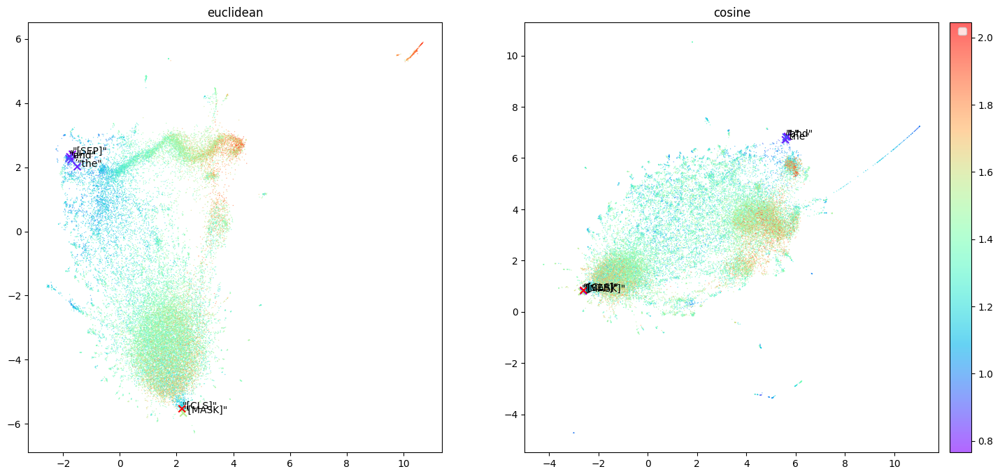

In [11]:
annotating_words = [',', '.', '[SEP]', '[MASK]', '[CLS]', 'the', 'and']
ids = tokenizer.convert_tokens_to_ids(annotating_words)

norms = w.norm(dim=1)

_, axes = plt.subplots(1, 2, figsize=[20, 8])
for method, ax in zip(transeds, axes):
  im = ax.scatter(*transeds[method].T, s=1, edgecolors='none', cmap='rainbow', c=norms, alpha=.6)#, vmin=0)
  # fig.colorbar(im, ax=ax)#, cmap=cmap)
  ax.set_title(method)

  ax.scatter(*transeds[method][ids].T, s=50, marker='x', label='special tokens', c=norms[ids], cmap='rainbow')
  for word, xy in zip(annotating_words, transeds[method][ids]):
    print(word)
    ax.annotate(f'"{word}"', xy)

cax, kw = mpl.colorbar.make_axes([ax for ax in axes.flat], pad=0.01)
# fig.colorbar(im, cmap=cmap)#, ax=ax)
plt.colorbar(im, cax=cax, **kw)
plt.legend()

In [12]:
# def get_projection(representations, n_neighbors=10, methods=['euclidean', 'cosine'], n_jobs=16):
#     transed_repr = {}
#     for method in methods:
#         reducer = umap.UMAP(n_neighbors=n_neighbors, metric=method, n_jobs=n_jobs)
#         transed_repr[method] = reducer.fit_transform(representations)
#     return transed_repr

In [18]:
from itertools import accumulate

def get_projection(*vectors, n_neighbors=10, methods=['euclidean', 'cosine'], n_jobs=16):
  accumed_lengths = list(accumulate([len(vec) for vec in vectors], initial=0))
  whole_vecs = np.concatenate(vectors)

  results = [{} for _ in range(len(vectors))]
  for method in methods:
    reducer = umap.UMAP(n_neighbors=n_neighbors, metric=method, n_jobs=n_jobs)
    result = reducer.fit_transform(whole_vecs)

    for i, (start, end) in enumerate(zip(accumed_lengths, accumed_lengths[1:])):
      results[i][method] = result[start:end]
  return results

In [1039]:
%%time
configs = model.config
depth = configs.num_hidden_layers
results = get_projection(w, 
                         *[layer.attention.self.query.weight.detach() for layer in model.bert.encoder.layer],
                         *[layer.attention.self.key.weight.detach() for layer in model.bert.encoder.layer])
transed_vec = results[0]
transed_qs = results[1:depth+1]
transed_ks = results[depth+1:]

CPU times: user 18min, sys: 1min 47s, total: 19min 48s
Wall time: 1min 17s


NameError: name 'transed_vec' is not defined

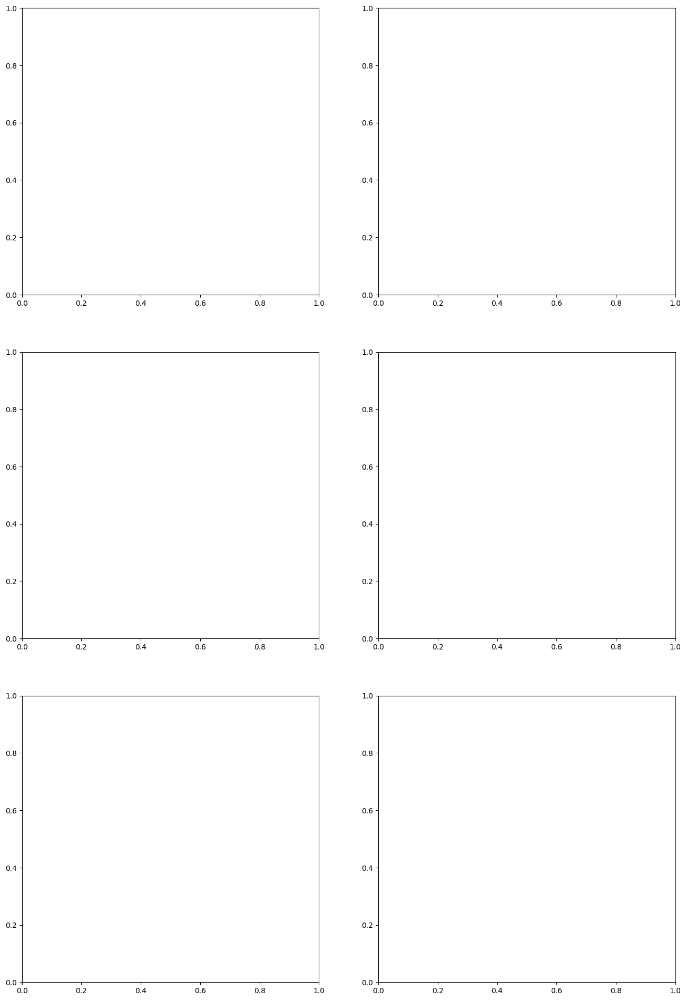

In [21]:
depth = 3

_, axes = plt.subplots(depth, 2, figsize=[16, 8*depth])

for r, row in enumerate(axes):
  for ax, method in zip(row, ['euclidean', 'cosine']):
    ax.scatter(*transed_vec[method].T, s=1, alpha=.1)
    ax.scatter(*transed_qs[r][method].T, s=5, marker='+', c=head_nums, cmap=plt.get_cmap('YlGn'), label='queries', alpha=.3)
    ax.scatter(*transed_ks[r][method].T, s=5, marker='x', c=head_nums, cmap=plt.get_cmap('OrRd'), label='keys', alpha=.3)
  
    ax.legend()

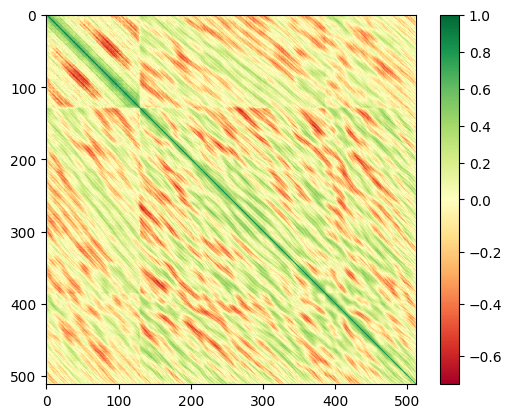

In [2048]:
sims = cosine_similarity(model.bert.embeddings.position_embeddings.weight.detach())
im = plt.imshow(sims, cmap='RdYlGn', norm=TwoSlopeNorm(0))
plt.colorbar(im)

query key
query value
key value


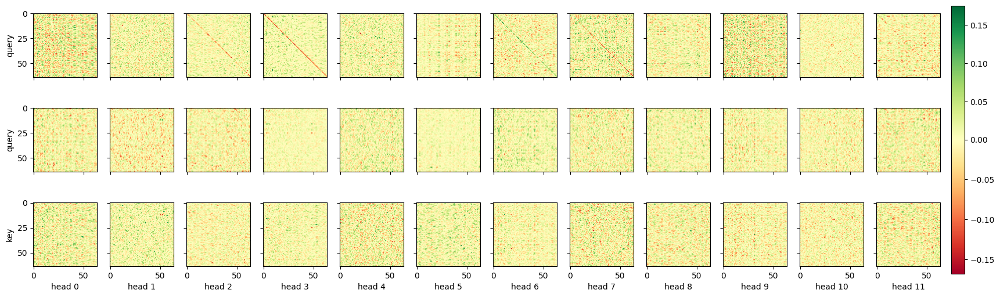

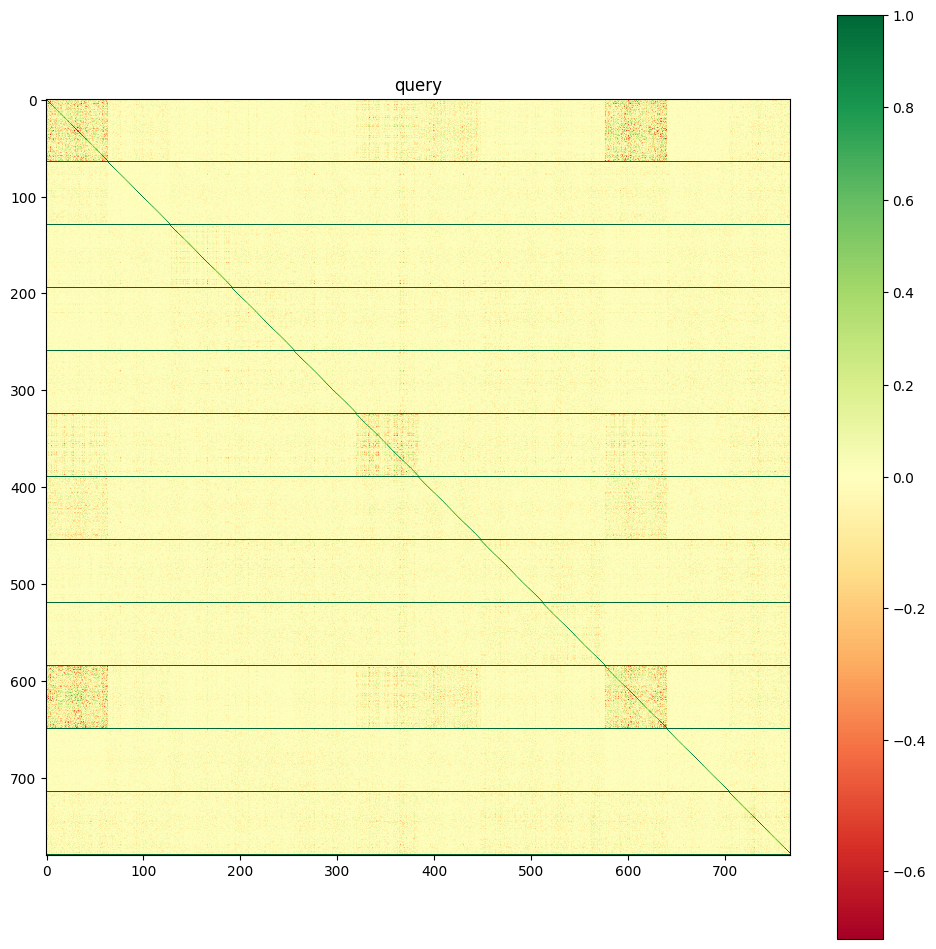

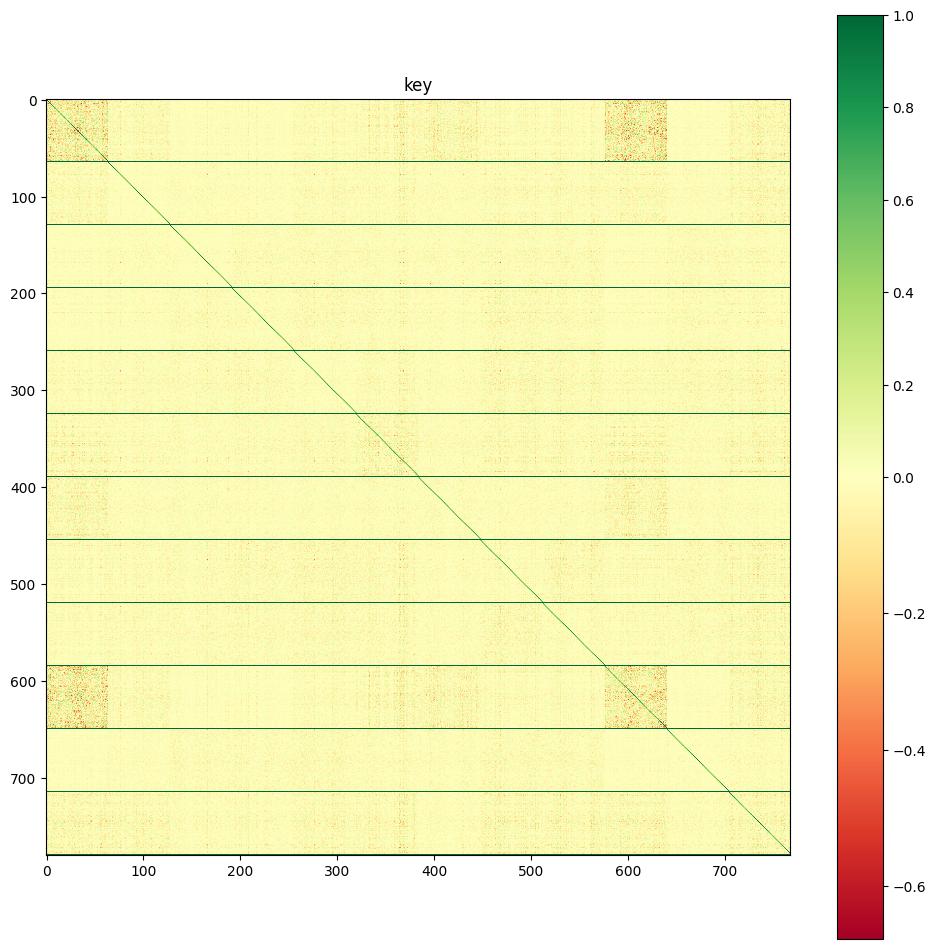

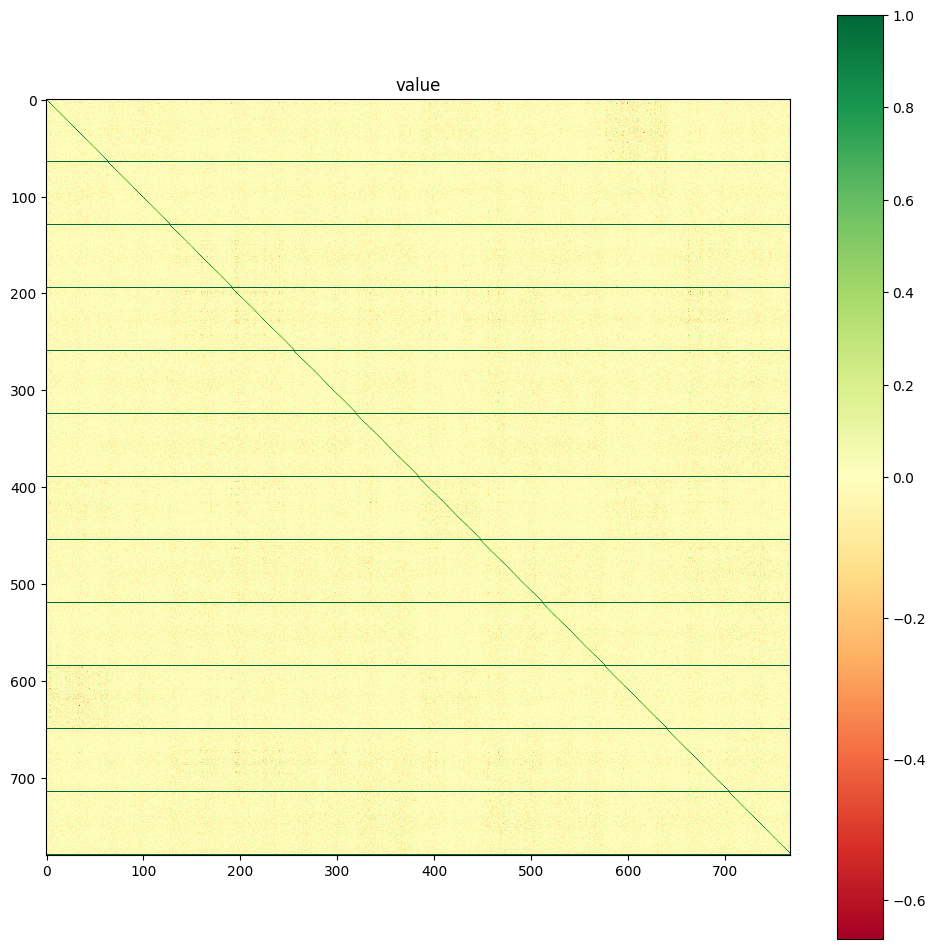

In [23]:
layer_num = 2

_, axes = plt.subplots(3, 12, figsize=[24,6], sharex=True, sharey=True)

attention = model.bert.encoder.layer[layer_num].attention
weights = {
  'query': attention.self.query.weight.detach(),
  'key': attention.self.key.weight.detach(),
  'value': attention.self.value.weight.detach(),
}

for name in weights:
  fig = plt.figure(figsize=[12, 12])
  plt.title(name)
  
  sims = cosine_similarity(weights[name].detach())
  sims_splitted = np.concatenate([np.concatenate([sims[i*hidden_dim:(i+1)*hidden_dim], np.ones([1, sims.shape[1]])]) for i in range(num_heads)])
  
  im = plt.imshow(sims_splitted, cmap='RdYlGn', norm=TwoSlopeNorm(0))
  fig.colorbar(im)#, ax=ax)

for i, (w_name1, w_name2) in enumerate(combinations(weights, 2)):
  axes[i, 0].set_ylabel(w_name1)
  print(w_name1, w_name2)
  sims = cosine_similarity(weights[w_name1], weights[w_name2])
  sims_diag = [sims[i*hidden_dim:(i+1)*hidden_dim, i*hidden_dim:(i+1)*hidden_dim] for i in range(num_heads)]

  for j, (sim, ax) in enumerate(zip(sims_diag, axes[i])):
    im = ax.imshow(sim, cmap='RdYlGn', norm=TwoSlopeNorm(0))

    if i == 2:
      ax.set_xlabel(f'head {j}')

cax, kw = mpl.colorbar.make_axes([ax for ax in axes.flat], pad=0.01)
# fig.colorbar(im, cmap=cmap)#, ax=ax)
plt.colorbar(im, cax=cax, **kw)

In [24]:
from bertviz import model_view

inputs = tokenizer.encode('Who is playing the piano in the room?', return_tensors='pt')
result = model.bert(inputs)
model_view(result[-1], tokenizer.convert_ids_to_tokens(inputs[0]))

<IPython.core.display.Javascript object>

In [ ]:
sims = cosine_similarity(pos_embs, w)
indices = sims.argsort(axis=1)[:, ::-1]

w_with_pos = torch.cat([w, pos_embs]).detach()

In [52]:
# positions samples: (2, 0)

layer_num = 6
head_num = 8
principal_components = 48

def print_direction(vectors, attention, head_num, hidden_dim, num_tops=7, principal_components=24):
  # attention = model.bert.encoder.layer[layer_num].attention.self
  if principal_components > 0:
    raw_q = attention.self.query.weight[head_num*hidden_dim:(head_num+1)*hidden_dim].detach().numpy()
    raw_k = attention.self.key.weight[head_num*hidden_dim:(head_num+1)*hidden_dim].detach().numpy()
    norm_products = np.linalg.norm(raw_q, axis=1) * np.linalg.norm(raw_k, axis=1)
    argsoft = norm_products.argsort()[::-1]
    # svd = TruncatedSVD(n_components=principal_components)
    # svd.fit_transform(np.diag(norm_products))
    
    # k_weights = svd.components_ @ raw_k
    # q_weights = svd.components_ @ raw_q
    k_weights = raw_k[argsoft]
    q_weights = raw_q[argsoft]
    
    top_indices = cosine_similarity(vectors, k_weights).argsort(axis=0)[::-1]
    k_tops = [tokenizer.convert_ids_to_tokens(ids) for ids in top_indices[:num_tops].T]

    top_indices = cosine_similarity(vectors, q_weights).argsort(axis=0)[::-1]
    q_tops = [tokenizer.convert_ids_to_tokens(ids) for ids in top_indices[:num_tops].T]
    
    norm_args = np.arange(principal_components)
    
  else:
    q_weights = attention.self.query.weight[head_num*hidden_dim:(head_num+1)*hidden_dim].detach().numpy()
    k_weights = attention.self.key.weight[head_num*hidden_dim:(head_num+1)*hidden_dim].detach().numpy()
    
    norm_args = (np.linalg.norm(q_weights, axis=1) * np.linalg.norm(k_weights, axis=1)).argsort()[::-1]
  
    top_indices = np.argsort(cosine_similarity(vectors, q_weights), axis=0)[::-1]  # shape [vocab_size, hidden_dim], most_sim to least
    q_tops = [tokenizer.convert_ids_to_tokens(ids) for ids in top_indices.T[norm_args, :num_tops]]
  
    top_indices = np.argsort(cosine_similarity(vectors, k_weights), axis=0)[::-1]  # shape [vocab_size, hidden_dim], most_sim to least
    k_tops = [tokenizer.convert_ids_to_tokens(ids) for ids in top_indices.T[norm_args, :num_tops]]
    

  v_weights = attention.self.value.weight[head_num*hidden_dim:(head_num+1)*hidden_dim].detach().numpy()
  # loadings = k_weights @ (v_weights/np.linalg.norm(v_weights, axis=1)[:, None]).T
  loadings = k_weights @ v_weights.T
  print(loadings.shape, q_weights.shape)
  directions = attention.output.dense.weight[head_num*hidden_dim:(head_num+1)*hidden_dim]
  
  directions_calib = (attention.output.LayerNorm(directions)).detach().numpy()
  directions = (attention.output.LayerNorm(directions) - attention.output.LayerNorm.bias).detach().numpy()
  displacements_calib = loadings @ directions_calib
  displacements = loadings @ directions
  displacements_calib += q_weights  ## 注意
  displacements_new_calib = loadings @ directions + q_weights# + attention.output.LayerNorm.bias.detach().numpy()
  displacements_new_calib =  (attention.output.LayerNorm(torch.from_numpy(loadings @ directions)) + attention.output.LayerNorm.bias).detach().numpy() + q_weights # 這樣好像才對，但是 directions 好像會被 LN 的 normalization 弄偏?
  
  top_indices = cosine_similarity(vectors, displacements).argsort(axis=0)[::-1]
  v_tops = [tokenizer.convert_ids_to_tokens(ids) for ids in top_indices.T[norm_args, :num_tops]]
  
  top_indices_calib = cosine_similarity(vectors, displacements_calib).argsort(axis=0)[::-1]
  v_tops_calib = [tokenizer.convert_ids_to_tokens(ids) for ids in top_indices_calib.T[norm_args, :num_tops]]

  top_indices_new_calib = cosine_similarity(vectors, displacements_new_calib).argsort(axis=0)[::-1]
  v_tops_new_calib = [tokenizer.convert_ids_to_tokens(ids) for ids in top_indices_new_calib.T[norm_args, :num_tops]]
  
  q_lengths = [len(''.join(words)) for words in q_tops]
  k_lengths = [len(''.join(words)) for words in k_tops]
  Mq, Mk = max(q_lengths), max(k_lengths)

  if principal_components > 0:
    print_heads = svd.explained_variance_ratio_
  else:
    print_heads = [0]*hidden_dim
    
  bias_indices = cosine_similarity(vectors, attention.output.LayerNorm.bias.detach()[None, :]).argsort(axis=0)[::-1].T[0]
  print(f"attention.output.LayerNorm.bias:", tokenizer.convert_ids_to_tokens(bias_indices[:num_tops]))
  print()
  print('without calibrating layerNorm')
  _ = [print(f"{ratio:.3f} [{', '.join(qs)}],{' '*(Mq-q_len)} [{', '.join(ks)}]{' '*(Mk-k_len)} += [{', '.join(vs)}]") \
       for ratio, qs, ks, vs, q_len, k_len in zip(print_heads, q_tops, k_tops, v_tops, q_lengths, k_lengths)]
  print()
  print('after calibrating layerNorm')
  _ = [print(f"{ratio:.3f} [{', '.join(qs)}],{' '*(Mq-q_len)} [{', '.join(ks)}]{' '*(Mk-k_len)} += [{', '.join(vs)}]") \
       for ratio, qs, ks, vs, q_len, k_len in zip(print_heads, q_tops, k_tops, v_tops_calib, q_lengths, k_lengths)]
  print()
  print('after calibrating layerNorm')
  _ = [print(f"{ratio:.3f} [{', '.join(qs)}],{' '*(Mq-q_len)} [{', '.join(ks)}]{' '*(Mk-k_len)} += [{', '.join(vs)}]") \
       for ratio, qs, ks, vs, q_len, k_len in zip(print_heads, q_tops, k_tops, v_tops_new_calib, q_lengths, k_lengths)]


print_direction(w_with_pos, model.bert.encoder.layer[layer_num].attention, head_num=head_num, hidden_dim=hidden_dim, num_tops=7, principal_components=0)

(64, 64) (64, 768)
attention.output.LayerNorm.bias: ['[SEP]', '[POS(0)]', '[CLS]', ',', 'the', 'and', '[MASK]']

without calibrating layerNorm
0.000 [are, when, canadians, armenia, rockies, flies, zimbabwe],                            [sold, ##logist, typing, constantinople, bolivia, didn, hers]                        += [under, [POS(473)], providence, [POS(327)], [POS(221)], spacecraft, mans]
0.000 [[POS(37)], [POS(34)], [POS(36)], [POS(39)], [POS(217)], [POS(38)], [POS(33)]],       [[POS(125)], [POS(223)], [POS(225)], [POS(241)], [POS(127)], [POS(124)], [POS(369)]] += [being, having, clair, working, certain, sim, rover]
0.000 [[POS(18)], slow, [POS(19)], waves, [POS(17)], flanked, frogs],                       [[POS(283)], [POS(217)], [POS(249)], [POS(218)], [POS(264)], ##ela, [POS(263)]]      += [bin, [POS(209)], ph, ., heights, [POS(179)], [POS(417)]]
0.000 [joined, retired, member, personnel, boxer, visiting, army],                          [career, industry, dante, master, [POS(4

In [1950]:
layer_num = 0
head_num = 4
num_tops = 20

word = 'machine'
ids = tokenizer(word, add_special_tokens=False, return_tensors='pt')['input_ids']
emb = model.bert.embeddings.word_embeddings(ids)[0, 0]

q = attention.self.query(emb)[head_num*hidden_dim:(head_num+1)*hidden_dim]
q_tops = cosine_similarity(emb.detach()[None, :], w_with_pos)[0].argsort()[::-1]

k = q @ attention.self.key.weight.T[head_num*hidden_dim:(head_num+1)*hidden_dim]
k_tops = cosine_similarity(k.detach()[None, :], w_with_pos)[0].argsort()[::-1]

v = attention.self.value(k)[head_num*hidden_dim:(head_num+1)*hidden_dim]
ln = attention.output.LayerNorm(attention.output.dense.weight.T[head_num*hidden_dim:(head_num+1)*hidden_dim])
v_tops = cosine_similarity((emb + v @ ln).detach()[None, :], w_with_pos)[0].argsort()[::-1]


# v_tops = cosine_similarity(v.detach()[None, :], w_with_pos)[0].argsort()[::-1]

print('word:', word)
print('q:', tokenizer.convert_ids_to_tokens(q_tops[:num_tops]))
print('k:', tokenizer.convert_ids_to_tokens(k_tops[:num_tops]))
print('v:', tokenizer.convert_ids_to_tokens(v_tops[:num_tops]))

word: machine
q: ['machine', 'machines', 'machinery', 'device', 'computer', 'computers', 'robotic', 'mechanized', '293', '1738', '213', 'robots', '1725', '1640', 'robot', '1653', '1650', '1796', '182', '30th']
k: ['[MASK]', 'estimates', 'accused', 'indies', 'skins', 'arcade', 'subject', '[POS(39)]', '[POS(355)]', '##rion', 'asylum', '##onale', 'reports', 'hanged', 'scottish', '[POS(350)]', 'ye', 'soundtrack', 'catch', 'holly']
v: ['"', 'the', 'that', 'organization', 'with', 'it', 'as', ',', 'you', 'is', 'this', 'your', 'me', 'us', '.', 'one', 'at', 'a', 'on', 'business']


In [1213]:
# 
time_embs = model.bert.embeddings.position_embeddings(torch.arange(32)).detach()
time_products = time_embs @ head_weights.T
plt.hist(time_products.detach().flatten())

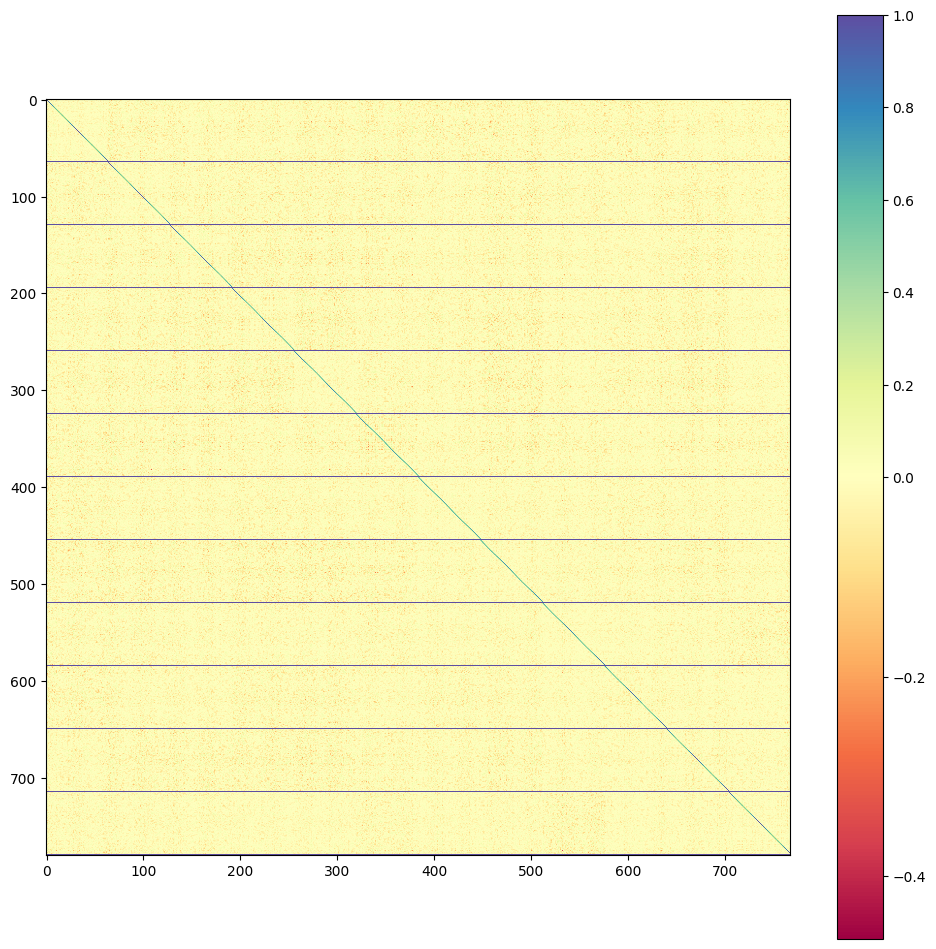

In [2042]:
sims = cosine_similarity(q_mod.weight.detach())
sims_splitted = np.concatenate([np.concatenate([sims[i*hidden_dim:(i+1)*hidden_dim], np.ones([1, sims.shape[1]])]) for i in range(num_heads)])

plt.subplots(1, 1, figsize=[12,12])
im = plt.imshow(sims_splitted, cmap='Spectral', norm=TwoSlopeNorm(0))
fig.colorbar(im, cmap=cmap)#, ax=ax)

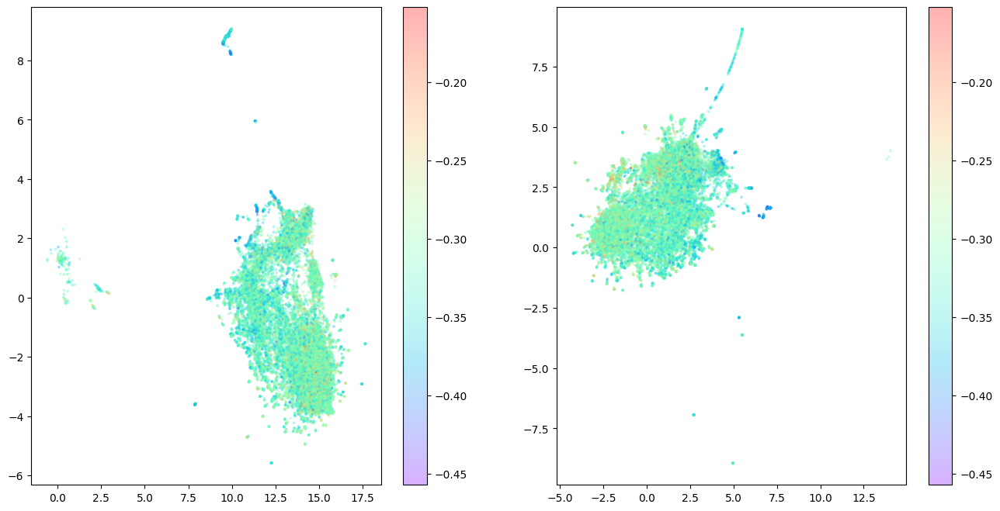

In [1122]:
Q = q_mod(w).detach()

cm = plt.get_cmap('rainbow')
_, axes = plt.subplots(1, 2, figsize=[16, 8])
for ax, method in zip(axes, ['euclidean', 'cosine']):
  im = ax.scatter(*transed_vec[method].T, s=3, alpha=.3, c=Q.T[1], cmap=cm)
  fig.colorbar(im, cmap=cmap, ax=ax)

In [608]:
m, M = w_pca[:, :2].min(axis=0).tolist(), w_pca[:, :2].max(axis=0).tolist()

from pycolormap_2d import ColorMap2DZiegler

cmap = ColorMap2DZiegler(range_x=(m[0], M[0]), range_y=(m[1], M[1]))
colors = np.stack([cmap(x,y) for x,y in w_pca[:, :2]]) / 256

In [840]:
from sklearn.metrics.pairwise import cosine_similarity

top_n = 10

cosines = cosine_distances(w[tokenizer.all_special_ids].detach(), w.detach())
idxs = cosines.argsort()[:, :top_n]
print(tokenizer.all_special_ids, tokenizer.convert_ids_to_tokens(tokenizer.all_special_ids))
cosines[np.tile(np.arange(0, len(tokenizer.all_special_ids)), [top_n-1, 1]).T, idxs[:,1:]]

[100, 102, 0, 101, 103] ['[UNK]', '[SEP]', '[PAD]', '[CLS]', '[MASK]']


array([[0.54299074, 0.54402274, 0.5482599 , 0.55465597, 0.5596026 ,
        0.5644128 , 0.569244  , 0.570244  , 0.57155514],
       [0.58618975, 0.65170884, 0.79625094, 0.7967042 , 0.79697084,
        0.80129236, 0.80158293, 0.8033706 , 0.8035612 ],
       [0.0096724 , 0.00968868, 0.00969464, 0.00995749, 0.00996363,
        0.00998557, 0.00999206, 0.00999761, 0.01003033],
       [0.34315574, 0.58618975, 0.73581505, 0.7457588 , 0.7465911 ,
        0.75334567, 0.75641036, 0.7646476 , 0.7652159 ],
       [0.34315574, 0.65170884, 0.70204383, 0.70395124, 0.70479965,
        0.71048504, 0.7106437 , 0.7143123 , 0.71451104]], dtype=float32)

((5, 2), torch.Size([30522]))

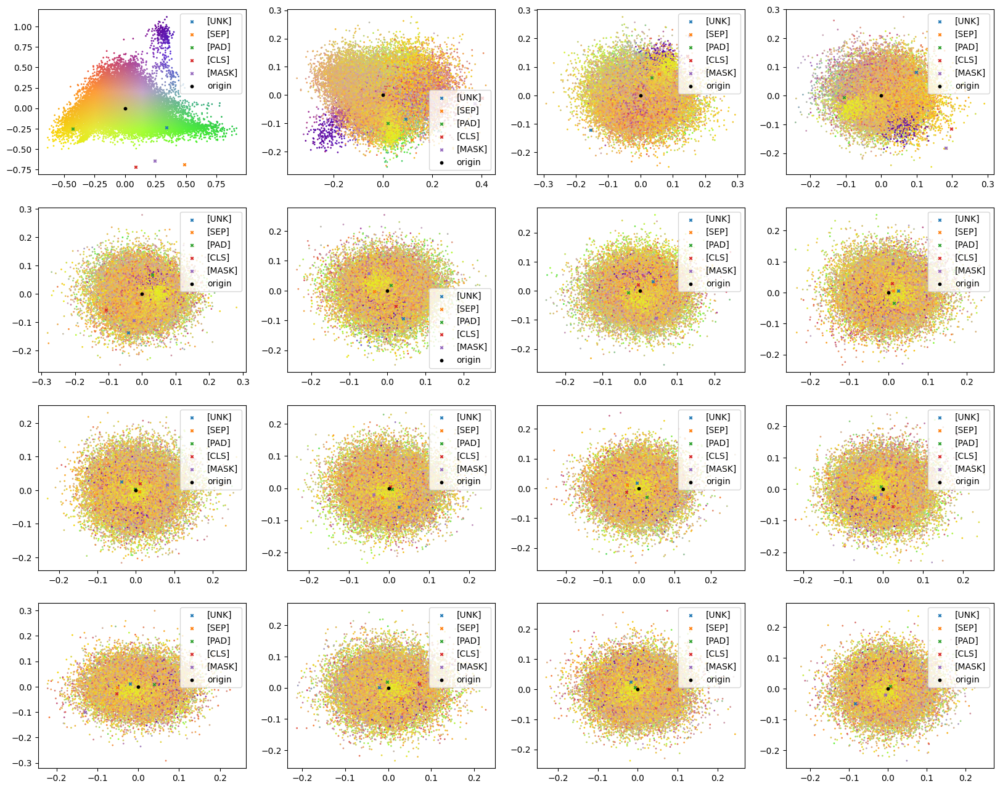

In [744]:
num_plotting = 4
n_rows, n_columns = 4, 4

_, axes = plt.subplots(n_rows, n_columns, figsize=[5*n_columns, 4*n_rows])
for i, ax in enumerate(axes.flatten()):
  ax.scatter(*w_pca.T[i*2:i*2+2], s=1, c=colors)
  spec_ids = tokenizer.all_special_ids
  _ = [ax.scatter(*w_pca[idx, i*2:i*2+2].T, marker='x', label=tok, s=10) for idx, tok in zip(spec_ids, tokenizer.convert_ids_to_tokens(spec_ids))]
  ax.scatter(0, 0, label='origin', color='black', s=10)
  ax.legend()

w_2d.shape, b.shape

In [364]:
sample = 'I love her new haircut.'
sample = 'I love math'
ids = tokenizer.encode(sample)
tokens = tokenizer.convert_ids_to_tokens(ids)

w_2d = w_pca[ids,:2]
tokens, ids, w_2d

(['[CLS]', 'i', 'love', 'math', '[SEP]'],
 [101, 1045, 2293, 8785, 102],
 array([[ 0.08815917, -0.7175332 ],
        [ 0.75233287, -0.25554988],
        [ 0.6234875 , -0.24686033],
        [ 0.2982147 , -0.02404069],
        [ 0.48845875, -0.68986565]], dtype=float32))

In [849]:
sentence = 'In mathematics, a limit is the value that a function (or sequence) approaches as the input (or index) approaches some value.'
tokenized = tokenizer([sentence], return_tensors='pt')
print(tokenized['input_ids'])
tokenizer.convert_ids_to_tokens(tokenized['input_ids'][0])

tensor([[ 101, 1999, 5597, 1010, 1037, 5787, 2003, 1996, 3643, 2008, 1037, 3853,
         1006, 2030, 5537, 1007, 8107, 2004, 1996, 7953, 1006, 2030, 5950, 1007,
         8107, 2070, 3643, 1012,  102]])


['[CLS]',
 'in',
 'mathematics',
 ',',
 'a',
 'limit',
 'is',
 'the',
 'value',
 'that',
 'a',
 'function',
 '(',
 'or',
 'sequence',
 ')',
 'approaches',
 'as',
 'the',
 'input',
 '(',
 'or',
 'index',
 ')',
 'approaches',
 'some',
 'value',
 '.',
 '[SEP]']

In [850]:
targeting_t = (tokenized['input_ids'] == 103)[0]
targeting_t = [5]

logits = model(**tokenized).logits[0]
target_logits = logits[targeting_t]
tokenizer.convert_ids_to_tokens(target_logits.argsort()[0, -5:])[::-1]

['limit', 'limits', 'limiting', 'restriction', 'limitation']

In [852]:
targeting_t = (tokenized['input_ids'] == 103)[0]
targeting_t = [0]
getting_result_layer = 12

embs = model.bert.embeddings(tokenized['input_ids'])
logits = model.cls(embs[0])
target_logits = logits[targeting_t]
top5 = tokenizer.convert_ids_to_tokens(target_logits.argsort()[0, -5:])[::-1]
print(f'initial emb: {top5}')

for i, layer in enumerate(model.bert.encoder.layer[:getting_result_layer]):
  embs = layer(embs)[0]
  logits = model.cls(embs[0])
  target_logits = logits[targeting_t]
  top5 = tokenizer.convert_ids_to_tokens(target_logits.argsort()[0, -5:])[::-1]
  print(f'layer {i}: {top5}')

# embs = embs[0, 1:]
embs

initial emb: ['the', 's', '"', 'was', "'"]
layer 0: ['patient', 'of', 'over', '.', 'car']
layer 1: ['can', 'car', 'cam', 'patient', 'lot']
layer 2: ['can', 'cam', 'patient', '##ful', 'the']
layer 3: ['the', 'blind', ')', 'patient', '.']
layer 4: ['the', ',', 'health', '.', 'and']
layer 5: ['and', 'the', 'iran', ',', '.']
layer 6: ['the', 'iran', 'a', 't', 'them']
layer 7: [')', 'the', 'iran', 't', 's']
layer 8: ['born', 'a', 'it', 's', 'the']
layer 9: ['meaning', 'born', 'shape', 'style', 'phrase']
layer 10: ['name', 'word', 'words', 'mi', 'shape']
layer 11: ['.', 'the', 'a', ')', 'of']


tensor([[[-0.1339, -0.9829, -0.4878,  ...,  0.5837, -0.0584,  0.8802],
         [ 0.5176,  0.2442, -1.1026,  ..., -0.3752, -0.6016,  0.6886],
         [-0.2889,  0.3261, -0.3020,  ..., -0.2853, -0.6984,  1.1383],
         ...,
         [ 0.3042, -0.2298,  0.3121,  ..., -0.3056, -0.7066,  0.1448],
         [ 0.7493, -0.1498, -0.3832,  ...,  0.2654, -0.6903, -0.4219],
         [-0.0091, -0.4263, -0.3401,  ...,  0.8579, -0.9049,  0.5692]]],
       grad_fn=<NativeLayerNormBackward0>)

In [ ]:
top_n = 10

idx = w.norm(dim=1).argsort()
shortest_word_tokens = tokenizer.convert_ids_to_tokens(idx[:top_n])
cosines = cosine_distances(w[idx[:10]].detach().numpy(), w.detach().numpy())

cos_closests = cosines.argsort(axis=1)[:, :top_n]

for index, vec, neighbor_idxs in zip(idx[:top_n], shortest_word_tokens, cos_closests):
  tokens = tokenizer.convert_ids_to_tokens(neighbor_idxs)
  euclid_dists = euclidean_distances(w.detach().numpy()[[index]], w[neighbor_idxs].detach().numpy())
  print(vec)
  print(tokens)
  print(euclid_dists)

In [539]:
logits = model.cls(embs[0])
target_logits = logits[(tokenized['input_ids'] == 103)[0]]
tokenizer.convert_ids_to_tokens(target_logits.argsort()[0, -5:])[::-1]

['he', 'she', 'it', 'dad', 'mom']

In [511]:
# from transformers import pipeline
# unmasker = pipeline('fill-mask', model='bert-base-uncased')
# unmasker(sentence)

In [ ]:
w = model.cls.predictions.transform.dense.weight.detach().numpy()
eig = np.linalg.eig(w)
print(eig.eigenvalues[:5])

idx = np.argsort(np.abs(eig.eigenvalues))
np.abs(eig.eigenvalues)[idx]

array([[1. , 0.3],
       [0.3, 1. ]])

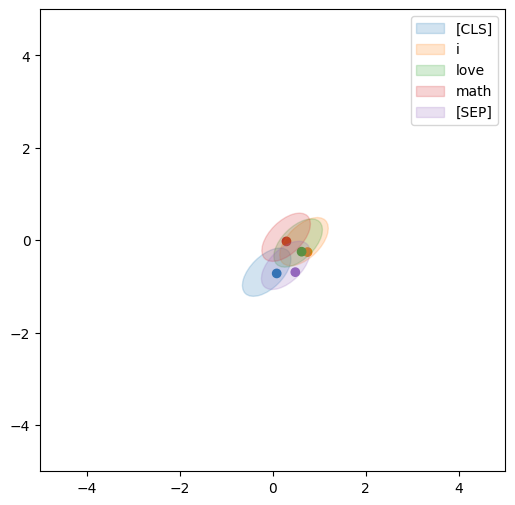

In [440]:
d = 2
cov = np.eye(d)
cov[[0,1], [1,0]] += .3
eigvals, eigvecs = np.linalg.eig(cov)
arg_idx = eigvals.argsort()[::-1]
eigvals, eigvecs = eigvals[arg_idx], eigvecs[:, arg_idx]
tan = (main_axis:=eigvecs.T[0])[1] / main_axis[0]
angle = np.arctan(tan) * 180 / np.pi

fig, ax = plt.subplots(1, 1, figsize=[6, 6])
plt.scatter(*w_2d.T, c=[cm.tab10(i) for i in range(len(w_2d))])
m, M = w_2d.min(0), w_2d.max(0)
lim = np.abs([m, M]).max(1) + .2
# plt.xlim(-lim[0], lim[0])
# plt.ylim(-lim[1], lim[1])
plt.xlim(-5, 5), plt.ylim(-5, 5)

ellipses = [Ellipse(center, *eigvals, angle=angle, alpha=.2, edgecolor=None, color=cm.tab10(i), label=token) for i, (token, center) in enumerate(zip(tokens, w_2d @ cov))]
_ = [ax.add_artist(ellipse) for ellipse in ellipses]
ax.legend()

cov

(5, 10000)


array([[-1.71980922,  2.34483871],
       [ 2.34483871,  0.37195104]])

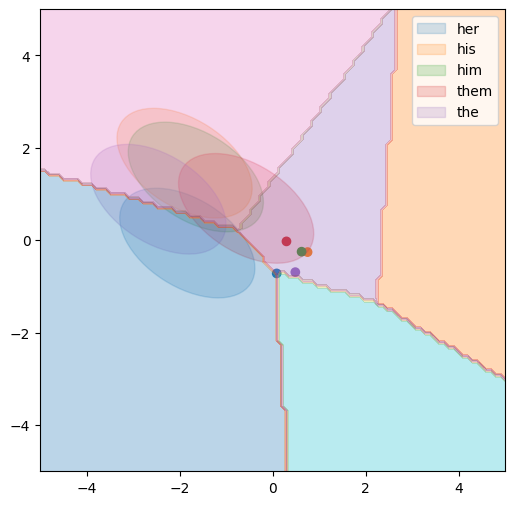

In [887]:
d = 2
cov = np.eye(d) + (r:=np.random.randn(d, d)) + r.T
cov = cov[:2, :2]
eigvals, eigvecs = np.linalg.eig(cov)
arg_idx = eigvals.argsort()[::-1]
eigvals, eigvecs = eigvals[arg_idx], eigvecs[:, arg_idx]
tan = (main_axis:=eigvecs.T[0])[1] / main_axis[0]
angle = np.arctan(tan) * 180 / np.pi
centers = w_2d @ cov

fig, ax = plt.subplots(1, 1, figsize=[6, 6])
plt.scatter(*w_2d.T, c=[cm.tab10(i) for i in range(len(w_2d))])
m, M = w_2d.min(0), w_2d.max(0)
lim = np.abs([m, M]).max(1) + .2
# plt.xlim(-lim[0], lim[0])
# plt.ylim(-lim[1], lim[1])
plt.xlim(-5, 5), plt.ylim(-5, 5)

ellipses = [Ellipse(center, *eigvals, angle=angle, alpha=.2, edgecolor=None, color=cm.tab10(i), label=token) for i, (token, center) in enumerate(zip(tokens, centers))]
_ = [ax.add_artist(ellipse) for ellipse in ellipses]
ax.legend()

def get_dicision_boundary(vectors, biases=0, xy_ranges=[-5, 5], density=100):
  x, y = np.meshgrid(np.linspace(*xy_ranges, density), np.linspace(*xy_ranges, density))
  z = vectors @ np.stack([x.flatten(), y.flatten()])
  print(z.shape)
  if isinstance(biases, np.ndarray):
    z += biases[:, None]
  else:
    z += biases
  z = z.argmax(axis=0).reshape(n, n)
  return x, y, z
  
x, y, z = get_dicision_boundary(w_2d, np.array([0, 0, .3, 0, 0]))
cntr = plt.contourf(x, y, z, cmap=cm.tab10, alpha=.3)

cov

In [891]:
rand_w = np.random.rand(20, 2)
rand_b = np.random.rand(20)

(20, 10000)


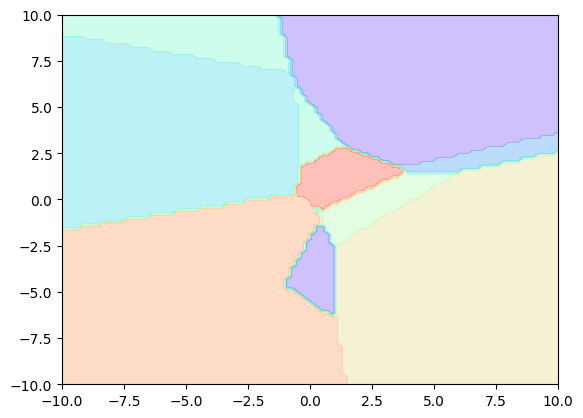

In [895]:
x, y, z = get_dicision_boundary(rand_w, rand_b, xy_ranges=[-10, 10])
cntr = plt.contourf(x, y, z, cmap=cm.rainbow, alpha=.3)

In [636]:
w = model.bert.embeddings.word_embeddings.weight
w = w.detach().numpy()
dist = cosine_distances(w[103:104], w)[0]

In [644]:
idx = dist.argsort()
print(dist[idx])
print(tokenizer.convert_ids_to_tokens(idx[:300]))

[5.9604645e-08 3.4315580e-01 6.5170872e-01 ... 1.0608133e+00 1.0614697e+00
 1.0685606e+00]
['[MASK]', '[CLS]', '[SEP]', '##´', '##\\', 'ァ', '禾', 'ᆼ', '##•', '##〈', '##‖', '##&', '事', '##‿', 'ャ', 'ᅵ', '##@', 'ᅭ', '##<', '‘', 'ᅢ', '宀', '##糹', '–', '##『', '##?', '囗', 'ᆫ', 'ি', '##。', 'မ', 'ಾ', '##>', 'ය', '##．', '##§', '疒', '’', '―', '##⇌', '“', '☉', 'ے', '##+', 'ರ', '##〜', 'ᅳ', '##„', '##⺩', '##־', '##』', '##宀', '##ರ', '##–', '##）', '##？', 'ᅮ', '##‘', '##{', '##辶', '##》', '##¶', '‒', '##!', '糹', 'ր', '訁', 'ு', '耳', '##’', '##氵', 'ᆸ', '##_', '##″', 'ᅧ', '##¡', '##囗', '##"', '###', 'ェ', '阝', '´', '##阝', '##%', 'ि', 'ா', '##忄', '##ක', '##,', '扌', '##《', '##‒', '##′', '部', '介', '##・', "##'", '##訁', '##‐', '##অ', 'ᆨ', '##]', '##~', 'ョ', 'ী', '##:', '##〉', '##(', '##₎', '##·', '##艹', '##-', '巿', 'ף', '##！', '##№', '##‡', '##†', '##氷', '##疒', 'ो', '##∅', '##「', 'ᅦ', '##‚', '…', '##阿', '也', '##扌', '##^', '⺩', 'ා', '##}', '##မ', '‐', '##/', '##宣', 'ி', '##[', 'ろ', '##示', 'ᅩ', 'ₕ', '##₍', '⽥', '##